In [1]:
import numpy as np
import pandas as pd
from dateutil import parser
from datetime import datetime
from statsmodels.tsa.stattools import adfuller

import os
import tensorflow.keras.utils as ku
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Bidirectional, Dropout, LSTM, Dense, Embedding, Flatten, GRU
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from math import sqrt
from tensorflow.keras.preprocessing.sequence import pad_sequences

physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], enable = True)

Exercício 1:
Utilize o dataset : dados_clima.csv

    - Plote duas características que variam ao longo
    - Monte um Agrupamento por dia e um agrupamento por mês
    - Faça uma análise estatística por meio de gráficos comparando a precipitacao ao longo do tempo para cada estado do dataset

In [2]:
dataClima = pd.read_csv("./dados_clima.csv", index_col = 'data', parse_dates = True)

In [3]:
dataClimaPr = dataClima.loc[dataClima["estado"] == "pr"]
dataClimaMt = dataClima.loc[dataClima["estado"] == "ms"]

In [4]:
#display(dataClimaPr)
dataClimaPrFormatado = dataClimaPr[["altitude", "cidade", "insolacao", "precipitacao", "tmax", "tmin", "ur"]]
dataClimaMtFormatado = dataClimaMt[["altitude", "cidade", "insolacao", "precipitacao", "tmax", "tmin", "ur"]]

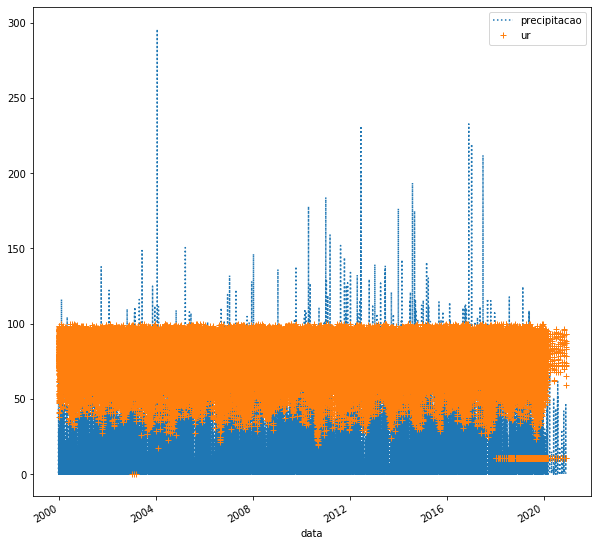

In [5]:
# - Plote duas características que variam ao longo
dataClimaPrFormatado[["precipitacao", "ur"]].plot(style=[':', "+"], figsize = (10,10))

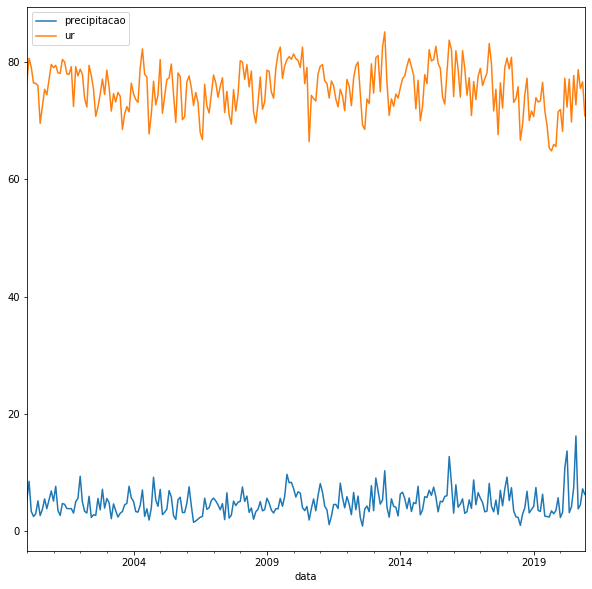

In [6]:
# - Monte um Agrupamento por dia e um agrupamento por mês
weekly = dataClimaPrFormatado.resample('M').mean()
weekly[["precipitacao", "ur"]].plot(figsize = (10,10))

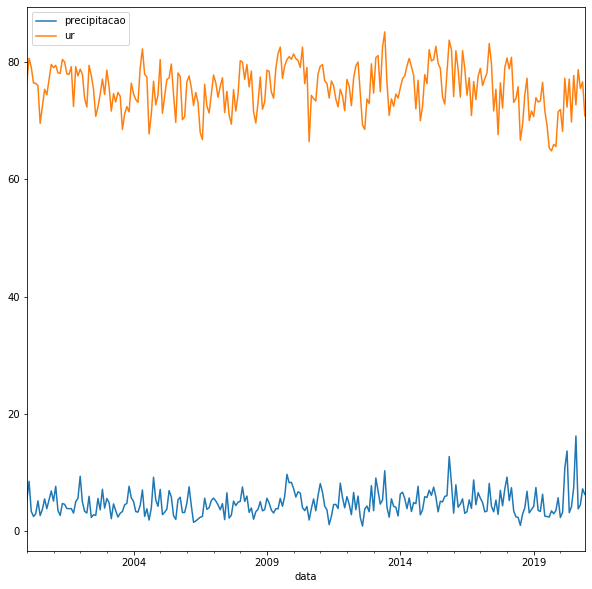

In [7]:
# - Faça uma análise estatística por meio de gráficos comparando a precipitacao ao longo do tempo para cada estado do dataset
# PARANA
weekly = dataClimaPr.resample('M').mean()
weekly[["precipitacao", "ur"]].plot(figsize = (10,10))

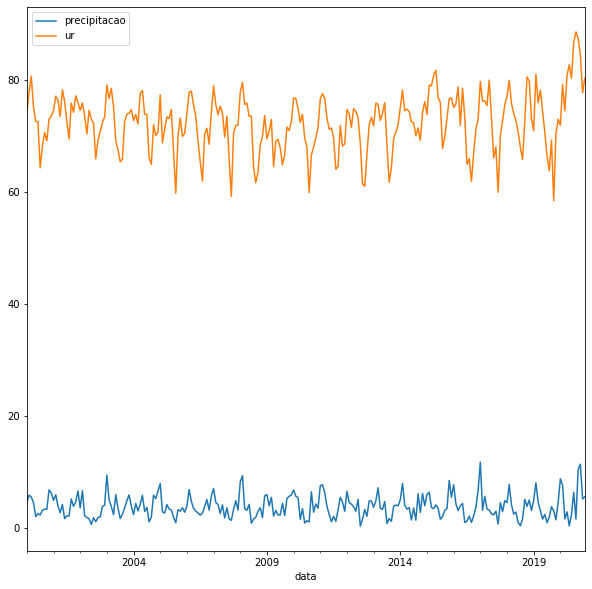

In [8]:
# - Faça uma análise estatística por meio de gráficos comparando a precipitacao ao longo do tempo para cada estado do dataset
# Mato Grosso do Sul
weekly = dataClimaMt.resample('M').mean()
weekly[["precipitacao", "ur"]].plot(figsize = (10,10))

Exercício 2:

Escolha um dos datasets apresentados (clima, passageiros, nascimentos-passaros, ou outro de interesse)

    - Modifique o shape de entrada para se adequar a rede neural
    - Monte uma rede neural RNN para predicao
    - Modifique essa rede neural para utilizar uma camada LSTM
    - Mostre o RMSE da predicao

In [9]:
dataClima.dropna(inplace=True)

In [10]:
# - Modifique o shape de entrada para se adequar a rede neural
dataTeste = dataClima.drop(columns=["Estacao", "cidade", "estado", "fonte"])
newData = dataTeste.reset_index(drop = True)
display(newData)
newData.shape

,altitude,insolacao,latitude,longitude,precipitacao,tmax,tmin,ur
0,130.0,12.4,-19.01,-57.65,1.2,33.6,24.4,59.25
1,130.0,12.3,-19.01,-57.65,0.0,35.6,21.5,60.75
2,130.0,12.4,-19.01,-57.65,0.0,37.2,23.8,58.75
3,130.0,12.2,-19.01,-57.65,0.0,37.4,23.7,57.25
4,130.0,7.0,-19.01,-57.65,0.0,35.0,23.8,67.50
...,...,...,...,...,...,...,...,...
211945,650.0,8.5,-26.05,-53.04,0.0,33.4,19.0,60.90
211946,650.0,9.0,-26.05,-53.04,0.0,32.8,21.6,59.50
211947,650.0,10.3,-26.05,-53.04,0.0,35.2,18.6,57.10
211948,650.0,6.8,-26.05,-53.04,0.0,34.2,21.0,66.40


(211950, 8)

In [11]:
newData.loc[newData["precipitacao"] > 0, "chove"] = 1
newData.loc[newData["precipitacao"] == 0, "chove"] = 0
newData

,altitude,insolacao,latitude,longitude,precipitacao,tmax,tmin,ur,chove
0,130.0,12.4,-19.01,-57.65,1.2,33.6,24.4,59.25,1.0
1,130.0,12.3,-19.01,-57.65,0.0,35.6,21.5,60.75,0.0
2,130.0,12.4,-19.01,-57.65,0.0,37.2,23.8,58.75,0.0
3,130.0,12.2,-19.01,-57.65,0.0,37.4,23.7,57.25,0.0
4,130.0,7.0,-19.01,-57.65,0.0,35.0,23.8,67.50,0.0
...,...,...,...,...,...,...,...,...,...
211945,650.0,8.5,-26.05,-53.04,0.0,33.4,19.0,60.90,0.0
211946,650.0,9.0,-26.05,-53.04,0.0,32.8,21.6,59.50,0.0
211947,650.0,10.3,-26.05,-53.04,0.0,35.2,18.6,57.10,0.0
211948,650.0,6.8,-26.05,-53.04,0.0,34.2,21.0,66.40,0.0


In [12]:
X = newData.drop(columns=["precipitacao", "chove"])
y = newData["chove"]

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [15]:
X_train

,altitude,insolacao,latitude,longitude,tmax,tmin,ur
5951,369.20,3.4,-22.30,-53.81,31.0,22.0,80.75
5858,369.20,8.9,-22.30,-53.81,31.1,19.4,77.25
151621,577.00,0.2,-23.03,-45.55,22.9,14.8,89.00
208909,650.00,1.6,-26.05,-53.04,24.8,15.8,83.60
207146,650.00,11.5,-26.05,-53.04,33.0,17.4,53.40
...,...,...,...,...,...,...,...
48227,923.50,8.4,-25.43,-49.26,18.5,5.9,80.50
170249,585.00,7.8,-23.22,-51.10,27.9,16.2,69.60
57448,836.96,0.1,-25.46,-50.63,24.2,16.9,89.75
76221,542.00,9.5,-23.40,-51.91,28.3,18.4,74.25


In [16]:
y_test

117324    1.0
120412    0.0
178787    0.0
155368    0.0
184098    0.0
         ... 
120126    0.0
119699    1.0
107089    0.0
585       0.0
120111    1.0
Name: chove, Length: 42390, dtype: float64

In [17]:
X_train.shape[0]
X_train.shape

(169560, 7)

In [18]:
y_train

5951      0.0
5858      0.0
151621    0.0
208909    1.0
207146    0.0
         ... 
48227     1.0
170249    0.0
57448     1.0
76221     1.0
178476    1.0
Name: chove, Length: 169560, dtype: float64

In [19]:
## BUILD MODEL
modelSimples = Sequential()
modelSimples.add(Dense(32, input_shape = (X_train.shape[1],)))
modelSimples.add(Dense(16, activation="relu"))
modelSimples.add(Dropout(0.2))
modelSimples.add(Dense(1, activation = 'sigmoid'))

optimizer = "RMSprop"
modelSimples.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ["accuracy"])
modelSimples.summary()
## BUILD MODEL

## FIT MODEL
hist = modelSimples.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size = 64, epochs = 10, verbose = 1)
##TRAIN MODEL

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                256       
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 17        
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________
Train on 169560 samples, validate on 42390 samples
Epoch 1/10
169560/169560 [==============================] - 6s 37us/sample - loss: 0.6974 - accuracy: 0.6734 - val_loss: 0.5607 - val_accuracy: 0.7021
Epoch 2/10
169560/169560 [============================

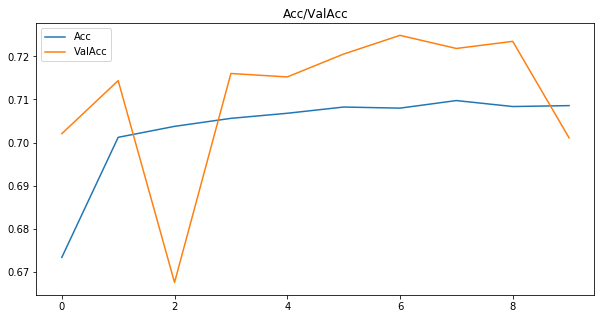

In [20]:
## PLOT MODEL
fig = plt.figure(figsize=(10, 5))
plt.plot(hist.history["accuracy"], label='Acc')
plt.plot(hist.history["val_accuracy"], label='ValAcc')
plt.legend()
plt.title('Acc/ValAcc')
plt.show()
## PLOT MODEL

In [21]:
y_predict = modelSimples.predict(X_test)
rms = sqrt(mean_squared_error(y_test, y_predict))
print(rms)

0.44048302878965917


# Preparacao LSTM

In [22]:
XNew = np.array(newData.drop(columns=["precipitacao"]))

timesToDevide = 5
newDataSet = XNew.reshape(((int(XNew.shape[0]/timesToDevide)), timesToDevide, XNew.shape[1]))

X = newDataSet[:,:,0:7]
y = newDataSet[:,:,-1]

In [23]:
X[0]

array([[130.  ,  12.4 , -19.01, -57.65,  33.6 ,  24.4 ,  59.25],
       [130.  ,  12.3 , -19.01, -57.65,  35.6 ,  21.5 ,  60.75],
       [130.  ,  12.4 , -19.01, -57.65,  37.2 ,  23.8 ,  58.75],
       [130.  ,  12.2 , -19.01, -57.65,  37.4 ,  23.7 ,  57.25],
       [130.  ,   7.  , -19.01, -57.65,  35.  ,  23.8 ,  67.5 ]])

In [24]:
y[0]

array([1., 0., 0., 0., 0.])

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [26]:
# - Modifique essa rede neural para utilizar uma camada LSTM

## BUILD MODEL
modelLSTM = Sequential()
modelLSTM.add(LSTM(32, input_shape = (timesToDevide, X_train.shape[2]), return_sequences=True))
modelLSTM.add(LSTM(16, dropout = 0.2, recurrent_dropout = 0.2))
modelLSTM.add(Dense(timesToDevide, activation = 'sigmoid'))

optimizer = "RMSprop"
modelLSTM.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ["accuracy"])
modelLSTM.summary()
## BUILD MODEL

## FIT MODEL
hist = modelLSTM.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size = 64, epochs = 10, verbose = 1)
##TRAIN MODEL

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 5, 32)             5120      
_________________________________________________________________
lstm_1 (LSTM)                (None, 16)                3136      
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 85        
Total params: 8,341
Trainable params: 8,341
Non-trainable params: 0
_________________________________________________________________
Train on 33912 samples, validate on 8478 samples
Epoch 1/10
33912/33912 [==============================] - 8s 238us/sample - loss: 0.6027 - accuracy: 0.6660 - val_loss: 0.5943 - val_accuracy: 0.6899
Epoch 2/10
33912/33912 [==============================] - 5s 153us/sample - loss: 0.5637 - accuracy: 0.6990 - val_loss: 0.5334 - val_accuracy: 0.7245
Epoch 3/10
33912/33912 [=========

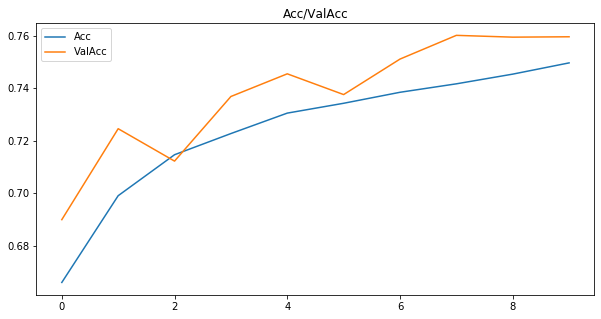

In [27]:
## PLOT MODEL
fig = plt.figure(figsize=(10, 5))
plt.plot(hist.history["accuracy"], label='Acc')
plt.plot(hist.history["val_accuracy"], label='ValAcc')
plt.legend()
plt.title('Acc/ValAcc')
plt.show()
## PLOT MODEL

In [28]:
y_predict = modelLSTM.predict(X_test)
rms = sqrt(mean_squared_error(y_test, y_predict))
print(rms)

0.4029843682381786
